# Pytorch Diffusion 모델 구현

**Sources:**
- Youtube [DeepFindr](https://www.youtube.com/watch?v=a4Yfz2FxXiY&ab_channel=DeepFindr)

- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)

- Niels Rogge, Kashif Rasul, [Huggingface notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)

- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)


In [ ]:
import math
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
from torch import nn
from torch.optim import Adam
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms

device = "cuda" if torch.cuda.is_available() else "cpu"

## Dataset 시각화

100%|██████████| 2753340328/2753340328 [02:20<00:00, 19590772.12it/s]


Extracting ./fgvc-aircraft-2013b.tar.gz to .


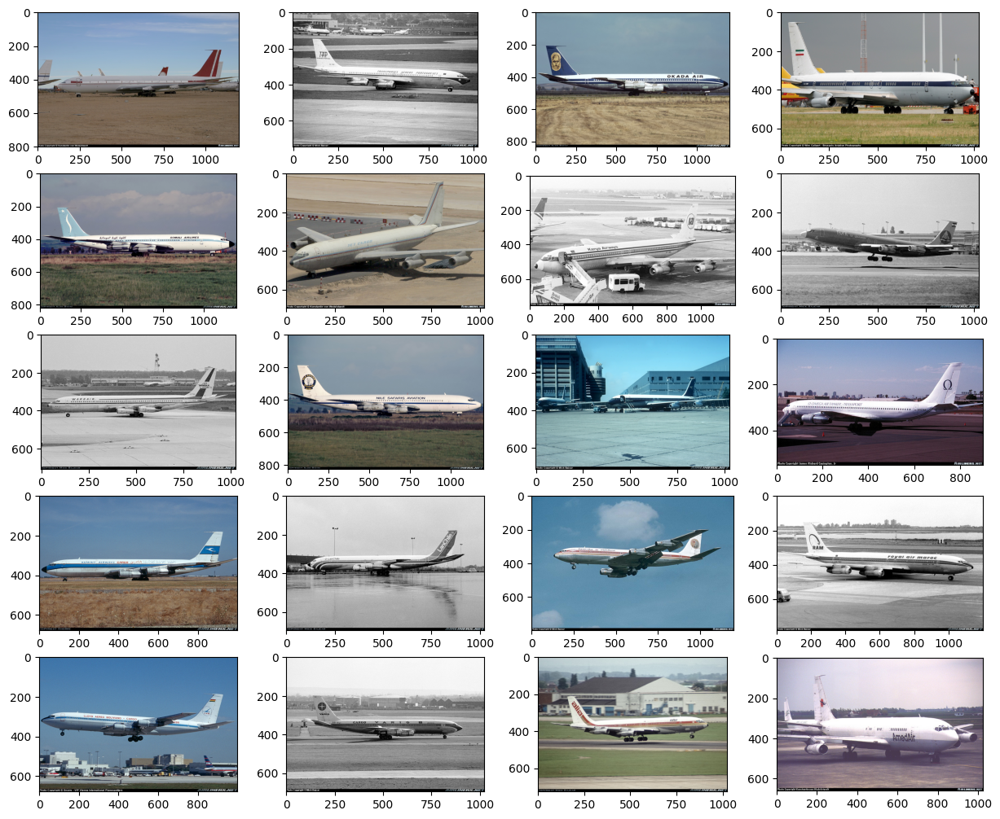

In [36]:
def show_images(data, num_samples=20, cols=4):
    plt.figure(figsize=(15,15))
    for i, img in enumerate(data):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img[0])

data = torchvision.datasets.FGVCAircraft(root=".", download=True, split='val')
        
show_images(data)

## 모델 구현

### Forward process
- T timestep 동안 노이즈를 점진적으로 추가
- 노이즈는 Linear schedule에 따라 생성

In [37]:
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    """ 주어진 타임스텝 수에 대해 선형 베타 스케줄을 생성 """
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    주어진 값 목록(vals)에서 특정 인덱스 t를 반환하면서 배치 차원을 고려
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())  # CPU에서 해당 인덱스의 값을 추출
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)  # 장치로 결과를 반환하고, 모양을 조정

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    입력 이미지와 타임스텝을 받아 노이즈가 추가된 이미지 버전을 반환
    """
    noise = torch.randn_like(x_0)  # 입력 이미지와 같은 크기의 랜덤 노이즈 생성
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)  # 알파의 제곱근 누적곱
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape  # 1에서 알파의 제곱근 누적곱을 뺀 값
    )
    # 평균과 분산을 이용하여 노이즈 이미지 생성
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)

In [ ]:
# 베타 스케줄을 정의
T = 300
betas = linear_beta_schedule(timesteps=T)

# closed form 변수 사전 계산
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

### 데이터셋 생성

In [39]:
IMG_SIZE = 64
BATCH_SIZE = 128

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.FGVCAircraft(root=".", 
                                              download=False, 
                                              transform=data_transform, 
                                              split='val')

    test = torchvision.datasets.FGVCAircraft(root=".", 
                                             download=True, 
                                             transform=data_transform, 
                                             split='test')
    return torch.utils.data.ConcatDataset([train, test])

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

In [ ]:
data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

### Froward process 시각화

/tmp/ipykernel_30/1509478405.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images+1, int(idx/stepsize) + 1)


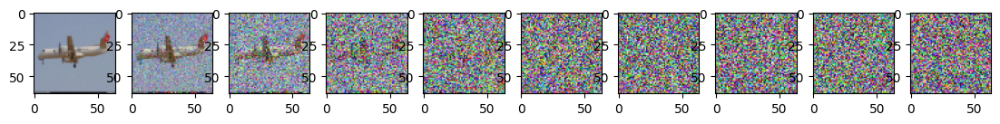

In [40]:
# Forward diffusion process
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

### Reverse process; U-Net
- 이미지에서 노이즈를 예측하기 위해 UNet 구조의 간소화된 형태를 사용
- 입력: 노이즈가 있는 이미지이며
- 출력: 이미지의 노이즈
- 임의의 timestep 중 하나를 추출하여 노이즈를 예측
- timestep: Positional(Sinusoidal) Embedding을 적용

In [ ]:
class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        """input/output channel, timestep embedding 차원, upsample 여부"""
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)  # timestep embedding MLP
        if up:  # Upsample
            self.conv1 = nn.Conv2d(2 * in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:   # Downsample
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU()

    def forward(self, x, t):
        """블록의 순전파: 입력 x와 시간 t를 처리"""
        h = self.bnorm1(self.relu(self.conv1(x)))  # Conv + BN
        time_emb = self.relu(self.time_mlp(t))  # Timestep embedding 생성
        time_emb = time_emb[(..., ) + (None, ) * 2]  # 마지막 두 차원 확장
        h = h + time_emb  # embedding + Feature map
        h = self.bnorm2(self.relu(self.conv2(h)))  # Conv + BN
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        """Sine, Cosine position embedding 초기화: embedding 차원을 입력받음"""
        super().__init__()
        self.dim = dim

    def forward(self, time):
        """embedding 생성 함수: 입력된 시간에 대한 embedding 반환"""
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class SimpleUnet(nn.Module):
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 3
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])
        
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep):
        # Time Embedding 
        t = self.time_mlp(timestep)
        # 첫 번째 Conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Skip connection
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)

In [41]:
model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

### Positional encoding

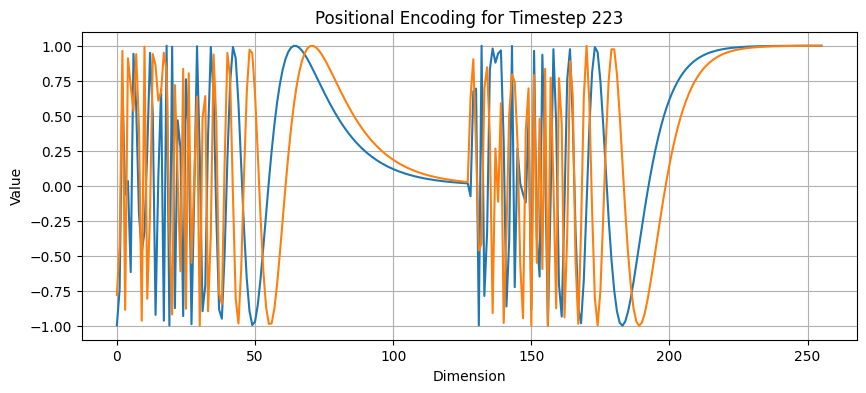

In [3]:
# 임의의 타임스텝을 생성
T = 300  # 총 타임스텝 수
device = "cuda" if torch.cuda.is_available() else "cpu"
random_timestep_1 = torch.randint(0, T, (1,), device=device).long()
random_timestep_2 = torch.randint(0, T, (1,), device=device).long()

# Positional Embedding 인스턴스 생성 및 타임스텝 임베딩
embedder = SinusoidalPositionEmbeddings(256)  # 임베딩 차원
time_embedding_1 = embedder(random_timestep_1)
time_embedding_2 = embedder(random_timestep_2)

# 임베딩 결과 시각화
plt.figure(figsize=(10, 4))
plt.plot(time_embedding_1[0].cpu().numpy())
plt.plot(time_embedding_2[0].cpu().numpy())
plt.title(f'Positional Encoding for Timestep {random_timestep.item()}')
plt.xlabel('Dimension')
plt.ylabel('Value')
plt.grid(True)
plt.show()

### 손실 함수
$$ L_{reverse} = || \epsilon(x_t, t) - \epsilon ||^2 $$

In [42]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [43]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    모델을 호출하여 이미지의 노이즈를 예측하고, 이미지의 노이즈를 제거한 결과를 반환
    마지막 단계가 아닐 경우, 이 이미지에 다시 노이즈를 적용
    """
    betas_t = get_index_from_list(betas, t, x.shape)  # 시간 t에 해당하는 베타 값
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape  # 시간 t에 해당하는 1 - 알파의 누적곱의 제곱근
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)  # 시간 t에 해당하는 알파의 역수의 제곱근

    # 현재 이미지에서 노이즈를 예측하고 평균을 계산
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)  # 후방 분산 값 추출

    if t == 0:
        # 논문에서 지적한 바와 같이 시간 t가 0일 때는 단순히 모델의 평균 값을 반환
        return model_mean
    else:
        noise = torch.randn_like(x)  # 추가할 랜덤 노이즈 생성
        return model_mean + torch.sqrt(posterior_variance_t) * noise  # 노이즈를 추가하여 결과 반환

@torch.no_grad()
def sample_plot_image():
    # 샘플 노이즈 이미지 생성
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)  # 표시할 이미지 간의 타임스텝 간격 계산

    for i in range(0, T)[::-1]:  # 타임스텝을 역순으로 반복하면서 이미지 생성
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)  # 각 타임스텝에 대한 이미지 생성
        img = torch.clamp(img, -1.0, 1.0)  # 이미지 값을 -1.0과 1.0 사이로 제한
        if i % stepsize == 0:  # 정해진 간격마다 이미지를 플롯에 추가
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()  # 생성된 이미지 시각화

## Training

0it [00:00, ?it/s]

Epoch 0 | step 000 Loss: 0.2671683430671692 


/tmp/ipykernel_30/3576216167.py:44: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


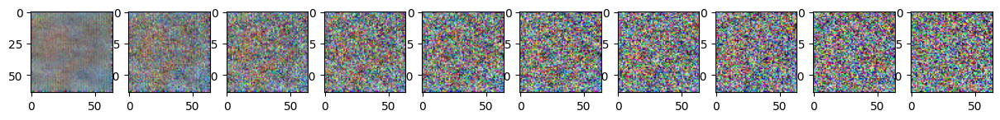

52it [01:18,  1.51s/it]
52it [01:13,  1.42s/it]
52it [01:14,  1.42s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
0it [00:00, ?it/s]

Epoch 5 | step 000 Loss: 0.14358314871788025 


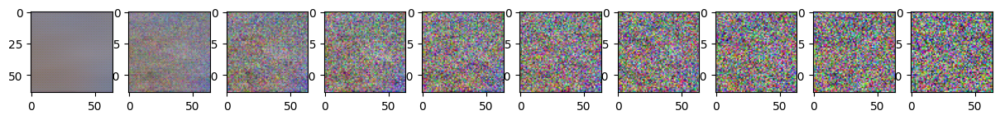

52it [01:17,  1.49s/it]
52it [01:13,  1.40s/it]
52it [01:13,  1.41s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.41s/it]
0it [00:00, ?it/s]

Epoch 10 | step 000 Loss: 0.1427064836025238 


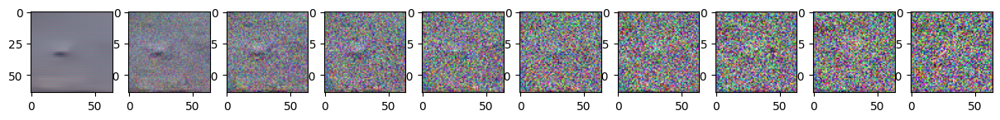

52it [01:17,  1.49s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
52it [01:14,  1.43s/it]
52it [01:14,  1.43s/it]
0it [00:00, ?it/s]

Epoch 15 | step 000 Loss: 0.1344747543334961 


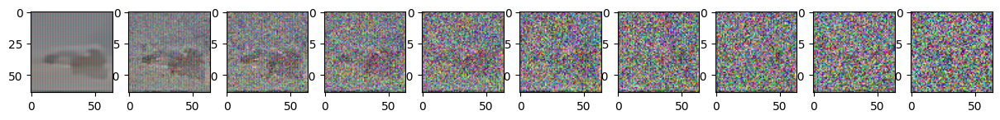

52it [01:17,  1.50s/it]
52it [01:14,  1.44s/it]
52it [01:13,  1.42s/it]
52it [01:14,  1.43s/it]
52it [01:13,  1.42s/it]
0it [00:00, ?it/s]

Epoch 20 | step 000 Loss: 0.12266366183757782 


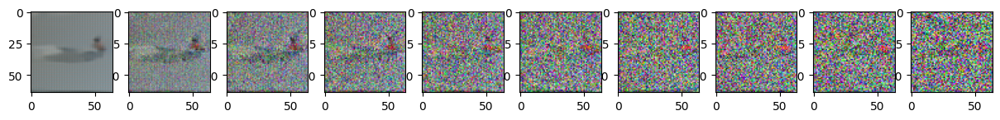

52it [01:18,  1.51s/it]
52it [01:14,  1.44s/it]
52it [01:15,  1.45s/it]
52it [01:14,  1.44s/it]
52it [01:14,  1.43s/it]
0it [00:00, ?it/s]

Epoch 25 | step 000 Loss: 0.1038728579878807 


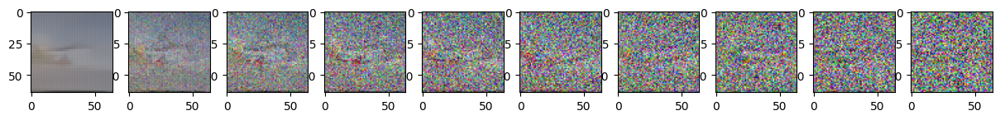

52it [01:18,  1.51s/it]
52it [01:13,  1.41s/it]
52it [01:13,  1.41s/it]
52it [01:13,  1.42s/it]
52it [01:14,  1.43s/it]
0it [00:00, ?it/s]

Epoch 30 | step 000 Loss: 0.10333558917045593 


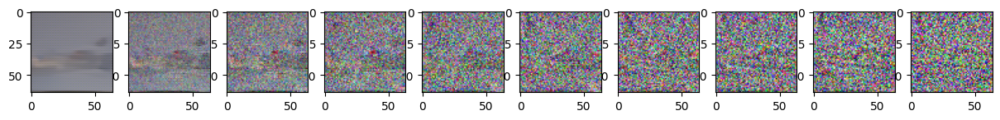

52it [01:18,  1.51s/it]
52it [01:14,  1.43s/it]
52it [01:15,  1.45s/it]
52it [01:15,  1.45s/it]
52it [01:14,  1.43s/it]
0it [00:00, ?it/s]

Epoch 35 | step 000 Loss: 0.12098713219165802 


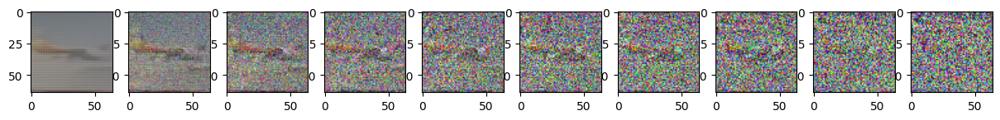

52it [01:19,  1.53s/it]
52it [01:15,  1.45s/it]
52it [01:15,  1.46s/it]
52it [01:14,  1.44s/it]
52it [01:13,  1.42s/it]
0it [00:00, ?it/s]

Epoch 40 | step 000 Loss: 0.11484210193157196 


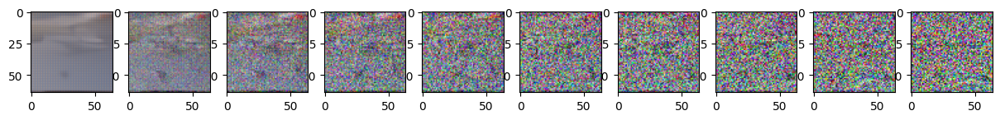

52it [01:19,  1.53s/it]
52it [01:14,  1.44s/it]
52it [01:15,  1.45s/it]
52it [01:15,  1.45s/it]
52it [01:15,  1.44s/it]
0it [00:00, ?it/s]

Epoch 45 | step 000 Loss: 0.10725971311330795 


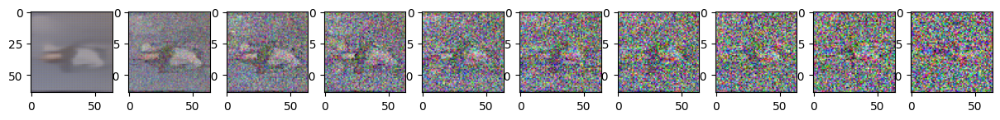

52it [01:17,  1.50s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
52it [01:14,  1.42s/it]
52it [01:13,  1.41s/it]
0it [00:00, ?it/s]

Epoch 50 | step 000 Loss: 0.09295924752950668 


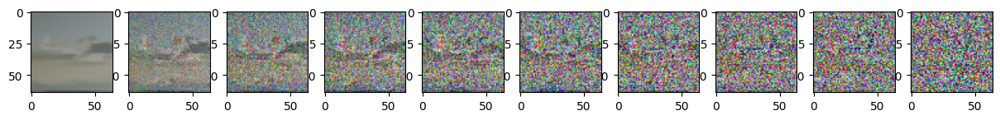

52it [01:17,  1.49s/it]
52it [01:13,  1.41s/it]
52it [01:13,  1.41s/it]
52it [01:13,  1.41s/it]
52it [01:13,  1.41s/it]
0it [00:00, ?it/s]

Epoch 55 | step 000 Loss: 0.10049431025981903 


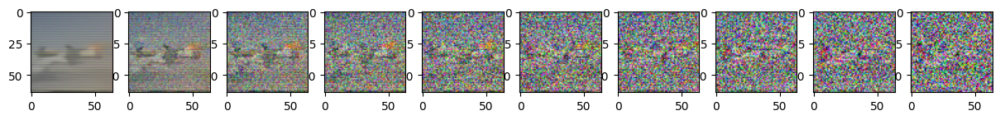

52it [01:17,  1.49s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.41s/it]
0it [00:00, ?it/s]

Epoch 60 | step 000 Loss: 0.10561579465866089 


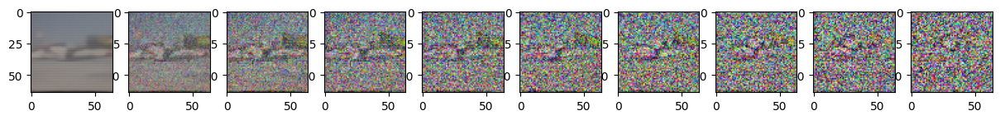

52it [01:18,  1.51s/it]
52it [01:14,  1.43s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
0it [00:00, ?it/s]

Epoch 65 | step 000 Loss: 0.1029655933380127 


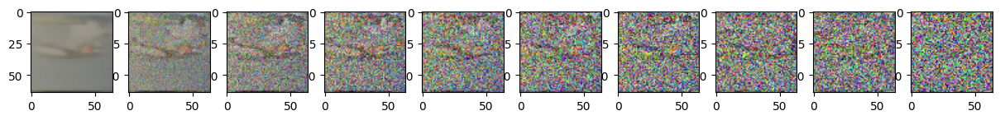

52it [01:17,  1.49s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
52it [01:13,  1.42s/it]
52it [01:14,  1.43s/it]
0it [00:00, ?it/s]

Epoch 70 | step 000 Loss: 0.1010388433933258 


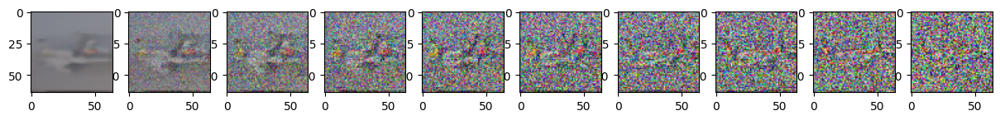

52it [01:17,  1.50s/it]
52it [01:13,  1.42s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 75 | step 000 Loss: 0.10974761843681335 


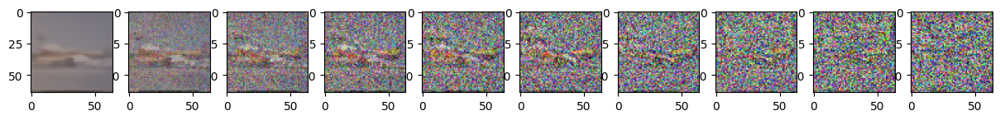

52it [01:16,  1.46s/it]
52it [01:13,  1.41s/it]
52it [01:12,  1.40s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
0it [00:00, ?it/s]

Epoch 80 | step 000 Loss: 0.10108113288879395 


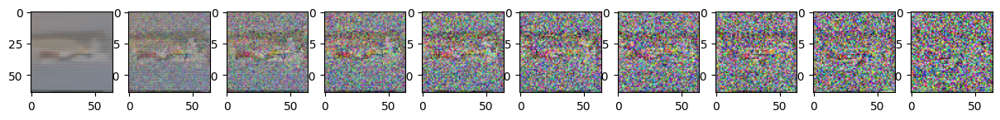

52it [01:16,  1.46s/it]
52it [01:11,  1.38s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:11,  1.38s/it]
0it [00:00, ?it/s]

Epoch 85 | step 000 Loss: 0.08750995248556137 


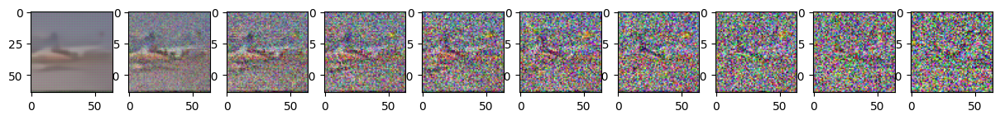

52it [01:17,  1.50s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
52it [01:13,  1.41s/it]
0it [00:00, ?it/s]

Epoch 90 | step 000 Loss: 0.10270316898822784 


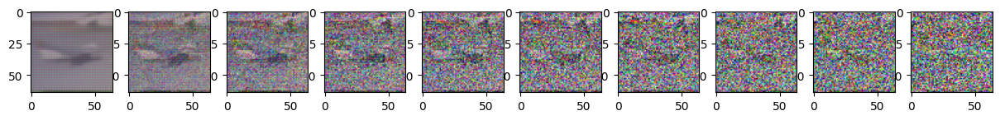

52it [01:16,  1.46s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 95 | step 000 Loss: 0.10739132761955261 


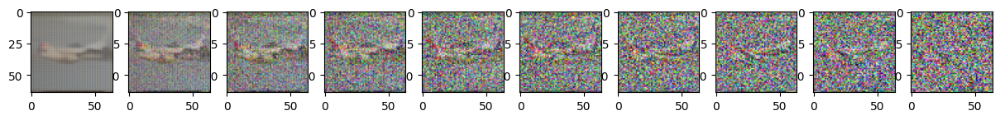

52it [01:15,  1.46s/it]
52it [01:11,  1.38s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.38s/it]
52it [01:12,  1.40s/it]


In [46]:
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100

for epoch in range(epochs):
    for step, batch in tqdm(enumerate(dataloader)):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()  # 배치 크기에 맞는 무작위 타임스텝 생성
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
            sample_plot_image()

0it [00:00, ?it/s]

Epoch 100 | step 000 Loss: 0.09387778490781784 


/tmp/ipykernel_30/3576216167.py:44: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


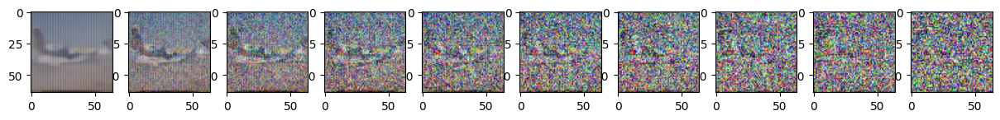

52it [01:16,  1.47s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 105 | step 000 Loss: 0.09851571172475815 


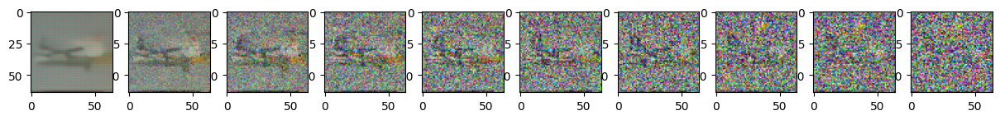

52it [01:16,  1.48s/it]
52it [01:12,  1.40s/it]
52it [01:13,  1.41s/it]
52it [01:13,  1.41s/it]
52it [01:13,  1.41s/it]
0it [00:00, ?it/s]

Epoch 110 | step 000 Loss: 0.11026056110858917 


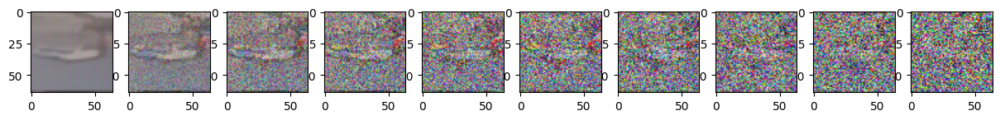

52it [01:17,  1.49s/it]
52it [01:13,  1.40s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 115 | step 000 Loss: 0.09954693168401718 


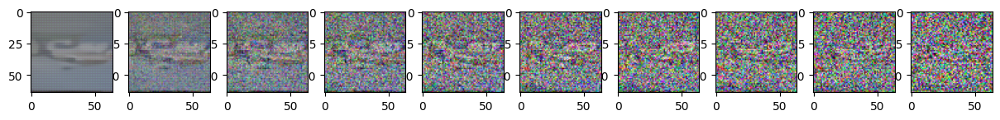

52it [01:17,  1.48s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
0it [00:00, ?it/s]

Epoch 120 | step 000 Loss: 0.09794377535581589 


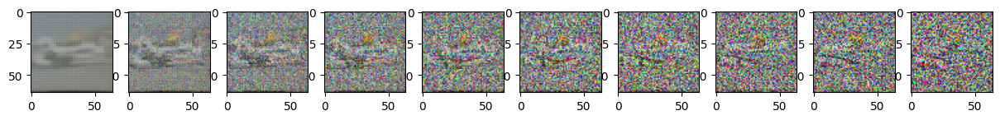

52it [01:17,  1.48s/it]
52it [01:13,  1.41s/it]
52it [01:12,  1.40s/it]
52it [01:15,  1.45s/it]
52it [01:17,  1.48s/it]
0it [00:00, ?it/s]

Epoch 125 | step 000 Loss: 0.10393171012401581 


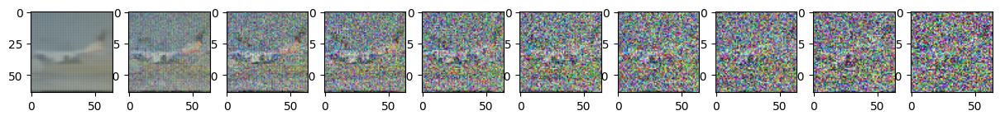

52it [01:19,  1.52s/it]
52it [01:16,  1.47s/it]
52it [01:15,  1.45s/it]
52it [01:16,  1.47s/it]
52it [01:14,  1.43s/it]
0it [00:00, ?it/s]

Epoch 130 | step 000 Loss: 0.11813966929912567 


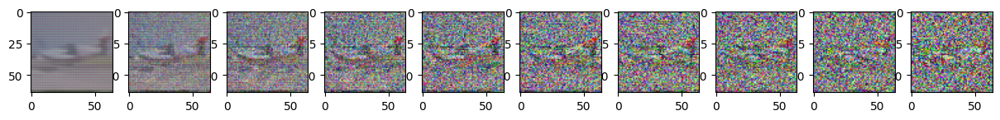

52it [01:15,  1.46s/it]
52it [01:11,  1.38s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 135 | step 000 Loss: 0.10382826626300812 


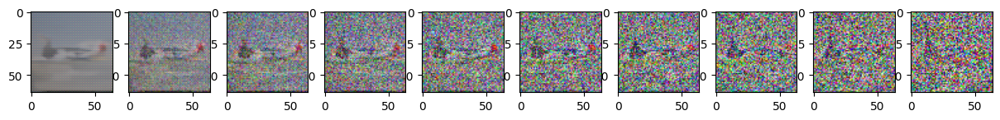

52it [01:15,  1.45s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 140 | step 000 Loss: 0.09604677557945251 


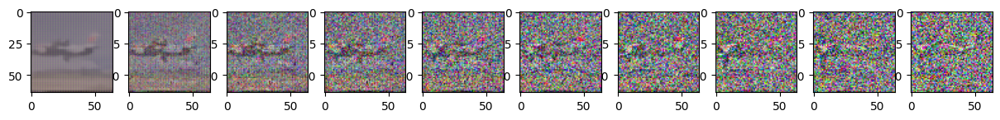

52it [01:16,  1.47s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 145 | step 000 Loss: 0.0978996753692627 


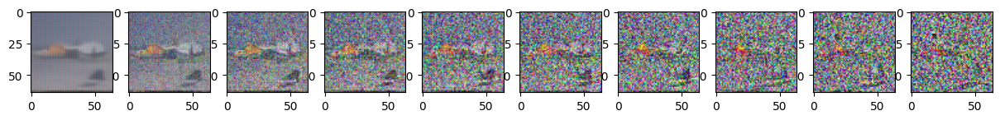

52it [01:15,  1.46s/it]
52it [01:11,  1.38s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 150 | step 000 Loss: 0.08881094306707382 


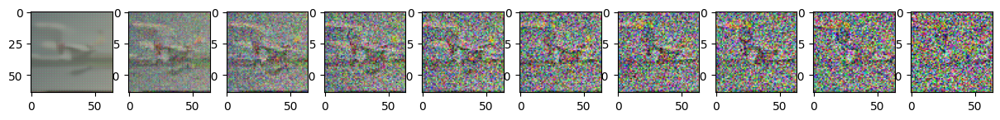

52it [01:15,  1.46s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
52it [01:13,  1.41s/it]
0it [00:00, ?it/s]

Epoch 155 | step 000 Loss: 0.10587513446807861 


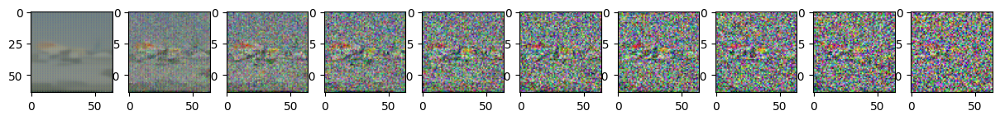

52it [01:16,  1.47s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 160 | step 000 Loss: 0.10238736122846603 


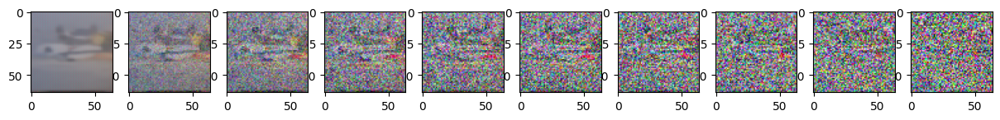

52it [01:17,  1.49s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
0it [00:00, ?it/s]

Epoch 165 | step 000 Loss: 0.0904167890548706 


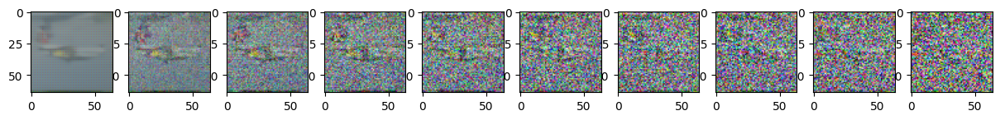

52it [01:16,  1.47s/it]
52it [01:13,  1.41s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.39s/it]
52it [01:11,  1.38s/it]
0it [00:00, ?it/s]

Epoch 170 | step 000 Loss: 0.10241365432739258 


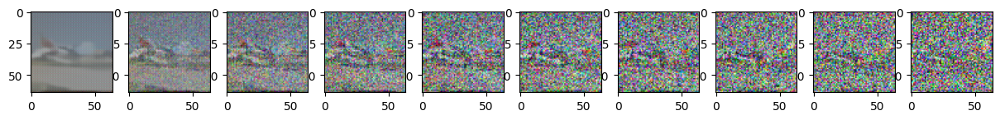

52it [01:15,  1.45s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
0it [00:00, ?it/s]

Epoch 175 | step 000 Loss: 0.11504925787448883 


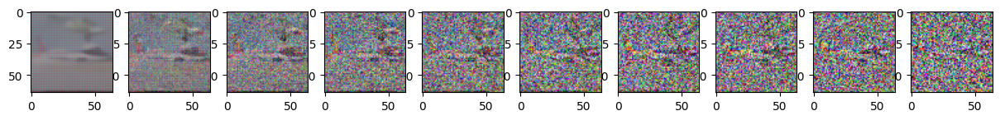

52it [01:15,  1.45s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
0it [00:00, ?it/s]

Epoch 180 | step 000 Loss: 0.10834215581417084 


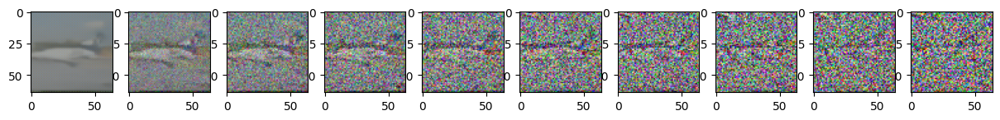

52it [01:15,  1.45s/it]
52it [01:11,  1.38s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.40s/it]
52it [01:11,  1.38s/it]
0it [00:00, ?it/s]

Epoch 185 | step 000 Loss: 0.09913212060928345 


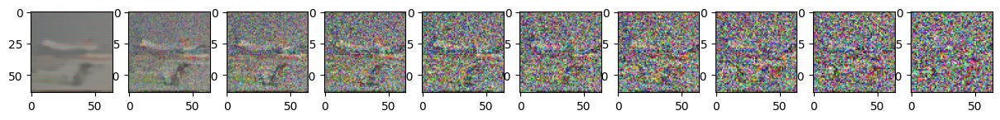

52it [01:16,  1.47s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]
52it [01:13,  1.41s/it]
52it [01:12,  1.40s/it]
0it [00:00, ?it/s]

Epoch 190 | step 000 Loss: 0.09659039974212646 


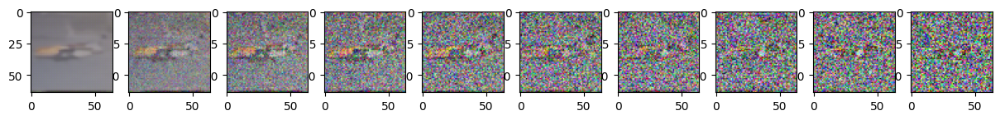

52it [01:18,  1.51s/it]
52it [01:13,  1.41s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
52it [01:12,  1.40s/it]
0it [00:00, ?it/s]

Epoch 195 | step 000 Loss: 0.09222874045372009 


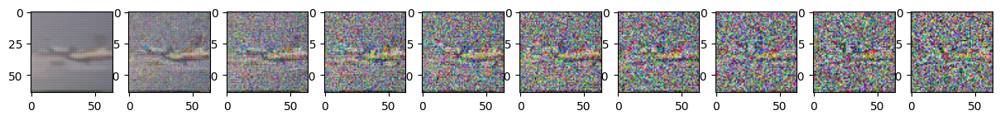

52it [01:16,  1.47s/it]
52it [01:11,  1.38s/it]
52it [01:11,  1.38s/it]
52it [01:12,  1.39s/it]
52it [01:12,  1.39s/it]


In [47]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100 # Try more!

for epoch in range(epochs):
    for step, batch in tqdm(enumerate(dataloader)):
      optimizer.zero_grad()

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, batch[0], t)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0 and step == 0:
        print(f"Epoch {epoch+100} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()
torch.save(model.state_dict(), 'model.pth')